In [1]:
# load libraries and code
#import gdown
import matplotlib.pyplot as plt
import numpy as np
#import os
import pandas as pd
import pyro
import pyro.distributions as pyrodist
import scanpy as sc
import seaborn as sns
#import time
import torch
import torch.utils.data
import torchvision.utils as vutils
import umap
from abc import abstractmethod
from anndata.experimental.pytorch import AnnLoader
from importlib import reload
from math import pi, sin, cos, sqrt, log
from pyro.infer import SVI, JitTrace_ELBO, Trace_ELBO, TraceGraph_ELBO
from pyro.optim import Adam
import sklearn
from sklearn import datasets as skds
from sklearn.cluster import KMeans
from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn import mixture
from toolz import partial, curry
from torch import nn, optim, distributions, Tensor
from torch.nn.functional import one_hot
from torchvision import datasets, transforms, models
from torchvision.utils import save_image, make_grid
from typing import Callable, Iterator, Union, Optional, TypeVar
from typing import List, Set, Dict, Tuple
from typing import Mapping, MutableMapping, Sequence, Iterable
from typing import Union, Any, cast, IO, TextIO
from torch.utils.data import WeightedRandomSampler
# my own sauce
from my_torch_utils import denorm, normalize, mixedGaussianCircular
from my_torch_utils import fclayer, init_weights, buildNetwork
from my_torch_utils import fnorm, replicate, logNorm, log_gaussian_prob
from my_torch_utils import plot_images, save_reconstructs, save_random_reconstructs
from my_torch_utils import scsimDataset
import my_torch_utils as ut
from importlib import reload
from torch.nn import functional as F
import gmmvae03 as M3
import gmmvae04 as M4
import gmmvae05 as M5
import gmmvae06 as M6
import gmmvae07 as M7
import gmmvae08 as M8
print(torch.cuda.is_available())


sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white', )

enc = OneHotEncoder(sparse=False, dtype=np.float32)
enc_ct = LabelEncoder()

#adata = sc.read("./data/GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad",)
# keep a second copy in the original state
#adatac = sc.read("./data/GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad",)

True
True
True
True
True
True
True
scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.22.1 scipy==1.7.3 pandas==1.4.0 scikit-learn==1.0.2 statsmodels==0.13.1 python-igraph==0.9.9 louvain==0.7.1 pynndescent==0.5.6


In [2]:
adata = sc.read("./data/gtex_v7_SMTS.h5ad")
sc.pp.filter_cells(adata, min_genes=200, inplace=True,)
sc.pp.filter_genes(adata, min_cells=20, inplace=True,)
sc.pp.normalize_total(adata, target_sum=1e4, inplace=True,)
sc.pp.log1p(adata, )

filtered out 2334 genes that are detected in less than 20 cells
normalizing counts per cell
    finished (0:00:00)


In [3]:
data = torch.FloatTensor(adata.X)
enc_ct.fit(adata.obs["smts"])
labels = torch.IntTensor(
        enc_ct.transform(adata.obs["smts"]))
labels = F.one_hot(labels.long(), num_classes=enc_ct.classes_.size).float()
dataset = ut.SynteticDataSet(data, labels)
data_loader = torch.utils.data.DataLoader(
        dataset=dataset,
        batch_size=256,
        shuffle=True,
        )

In [4]:
sc.pp.pca(adata,)
sc.pp.neighbors(adata, use_rep="X_pca", n_neighbors=10,)
sc.tl.umap(adata,)

computing PCA
    with n_comps=50
    finished (0:00:17)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP


/home/ykolb/miniconda3/envs/torch/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


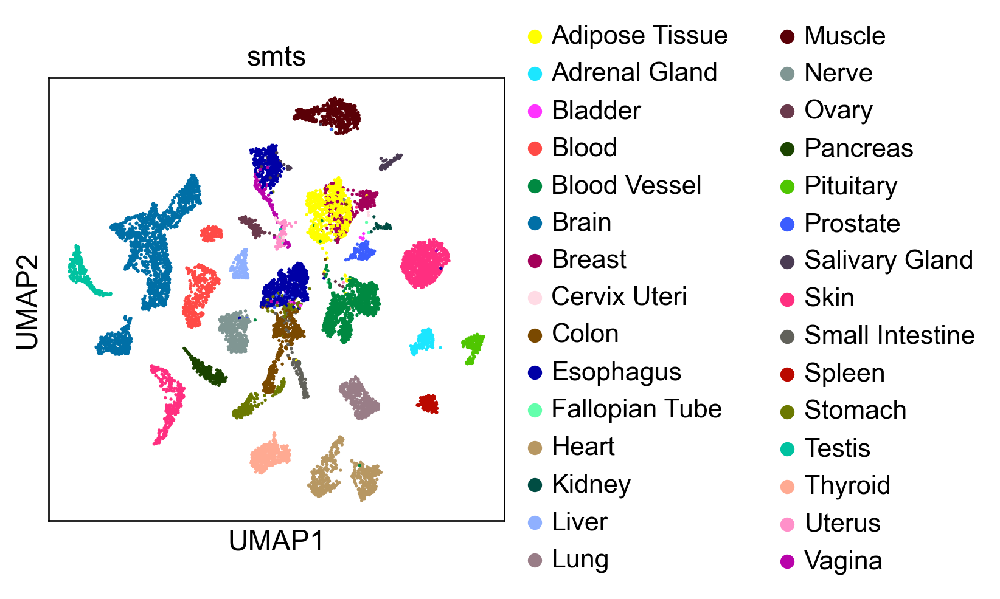

In [5]:
sc.pl.umap(adata, color=["smts", ],)

In [6]:
labeled_loader = torch.utils.data.DataLoader(
        dataset=ut.SynteticDataSet(data[:1600], labels[:1600]),
        batch_size=256,
        shuffle=True,
        )
unlabeled_loader = torch.utils.data.DataLoader(
        dataset=ut.SynteticDataSet(data[1600:-1500], labels[1600:-1500]),
        batch_size=256,
        shuffle=True,
        )
test_loader = torch.utils.data.DataLoader(
        dataset=ut.SynteticDataSet(data[-1500:], labels[-1500:]),
        batch_size=256,
        shuffle=True,
        )

In [9]:
model = M8.VAE_Dirichlet_Type705(nx=adata.n_vars, nclasses=30, nh=1024, nw=15, nz=64,)
model.apply(init_weights)

VAE_Dirichlet_Type705(
  (Px): Sequential(
    (linear1): Linear(in_features=64, out_features=1024, bias=True)
    (dropout1): Dropout(p=0.2, inplace=False)
    (batchnorm1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation1): LeakyReLU(negative_slope=0.01)
    (linear2): Linear(in_features=1024, out_features=1024, bias=True)
    (dropout2): Dropout(p=0.2, inplace=False)
    (batchnorm2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation2): LeakyReLU(negative_slope=0.01)
    (output_layer): Linear(in_features=1024, out_features=53868, bias=True)
  )
  (Pz): Sequential(
    (linear1): Linear(in_features=15, out_features=1024, bias=True)
    (dropout1): Dropout(p=0.2, inplace=False)
    (batchnorm1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation1): LeakyReLU(negative_slope=0.01)
    (linear2): Linear(in_features=1024, out_features=1024, bias

In [12]:
M8.basicTrain(model, data_loader, test_loader, num_epochs=30, wt=0, lr=1e-3,)

ValueError: Expected parameter loc (Tensor of shape (256, 15)) of distribution Normal(loc: torch.Size([256, 15]), scale: torch.Size([256, 15])) to satisfy the constraint Real(), but found invalid values:
tensor([[nan, nan, nan,  ..., nan, nan, nan],
        [nan, nan, nan,  ..., nan, nan, nan],
        [nan, nan, nan,  ..., nan, nan, nan],
        ...,
        [nan, nan, nan,  ..., nan, nan, nan],
        [nan, nan, nan,  ..., nan, nan, nan],
        [nan, nan, nan,  ..., nan, nan, nan]], device='cuda:0',
       grad_fn=<SliceBackward0>)

In [3]:
adata = sc.read("./data/GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad",)


data = torch.FloatTensor(adata.X.toarray())
enc_ct.fit(adata.obs["Granular cell type"])
labels = torch.IntTensor(
        enc_ct.transform(adata.obs["Granular cell type"]))
labels = F.one_hot(labels.long(), num_classes=enc_ct.classes_.size).float()
dataset = ut.SynteticDataSet(data, labels)
data_loader = torch.utils.data.DataLoader(
        dataset=dataset,
        batch_size=256,
        shuffle=True,
        )

#dataset = ut.SynteticDataSet(data, labels)
labeled_loader = torch.utils.data.DataLoader(
        dataset=ut.SynteticDataSet(data[:1600], labels[:1600]),
        batch_size=256,
        shuffle=True,
        )
unlabeled_loader = torch.utils.data.DataLoader(
        dataset=ut.SynteticDataSet(data[1600:-1500], labels[1600:-1500]),
        batch_size=256,
        shuffle=True,
        )
test_loader = torch.utils.data.DataLoader(
        dataset=ut.SynteticDataSet(data[-1500:], labels[-1500:]),
        batch_size=256,
        shuffle=True,
        )


In [3]:
model = M7.VAE_Dirichlet_Type705(nx=adata.n_vars, nh=1024,
        nz=64, nw=15, nclasses=enc_ct.classes_.size,)
model.apply(init_weights)

M8.basicTrain(model, unlabeled_loader, test_loader, num_epochs=20,
        wt=0, lr=1e-3,)


training phase
rec: 19157.724609375
loss_p: 1.1586546897888184
loss_z: 41.941802978515625
loss_w: 8.957418441772461
loss_l: 0.13735994696617126
loss_l_alt: 0.43514055013656616
loss_y: -0.08848851919174194
loss_d: 2279.75146484375
loss_y_alt: 1.7373336553573608
total_loss: 21490.11328125
num_clusters: 0

training phase
rec: 3029.478271484375
loss_p: 17.145599365234375
loss_z: 13.420975685119629
loss_w: 4.328710556030273
loss_l: 1.0467058420181274
loss_l_alt: 4.2342658042907715
loss_y: -0.9740262627601624
loss_d: 0.0
loss_y_alt: 16.706771850585938
total_loss: 3063.9345703125
num_clusters: 34

training phase
rec: 1937.473876953125
loss_p: 16.652334213256836
loss_z: 15.149017333984375
loss_w: 4.548530578613281
loss_l: 1.1721694469451904
loss_l_alt: 4.258022308349609
loss_y: -0.9794749021530151
loss_d: 0.0
loss_y_alt: 16.46053695678711
total_loss: 1973.632080078125
num_clusters: 32

training phase
rec: 1867.8763427734375
loss_p: 16.893871307373047
loss_z: 15.497538566589355
loss_w: 4.330539

In [4]:
model.eval()
output = model(data)
adata.obsm["z_gmmdvae"] = output["z"].detach().numpy()
adata.obs["predict_gmmdvae"] = output["q_y"].detach().argmax(-1).numpy().astype(str)

sc.pp.neighbors(adata, use_rep="z_gmmdvae", n_neighbors=10,)
sc.tl.umap(adata,)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:27)


/home/ykolb/miniconda3/envs/torch/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'predict_gmmdvae' as categorical


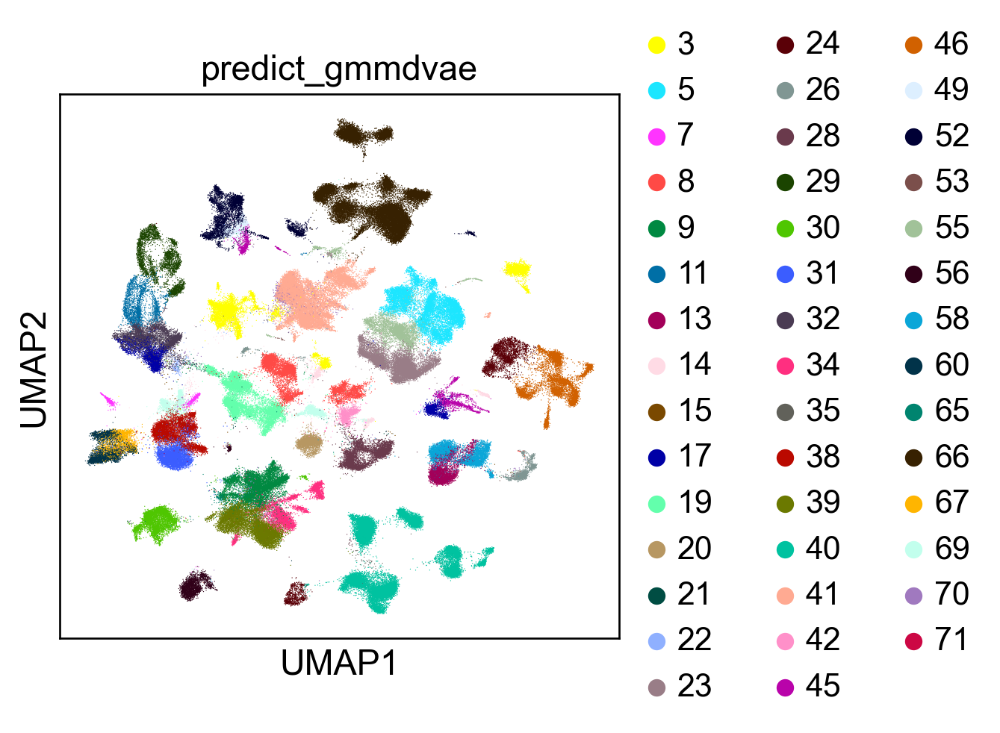

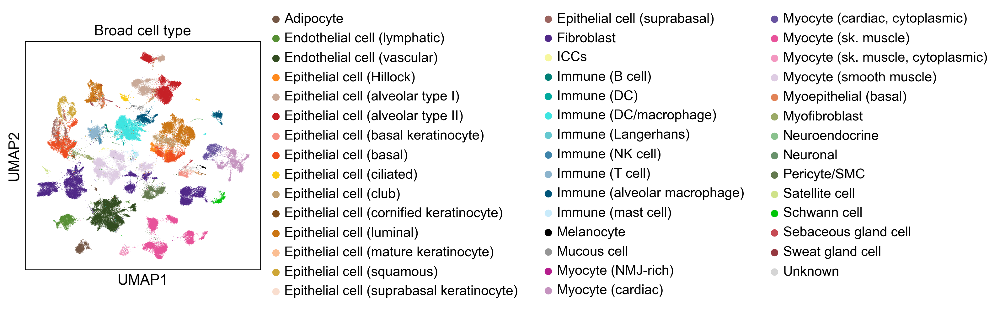

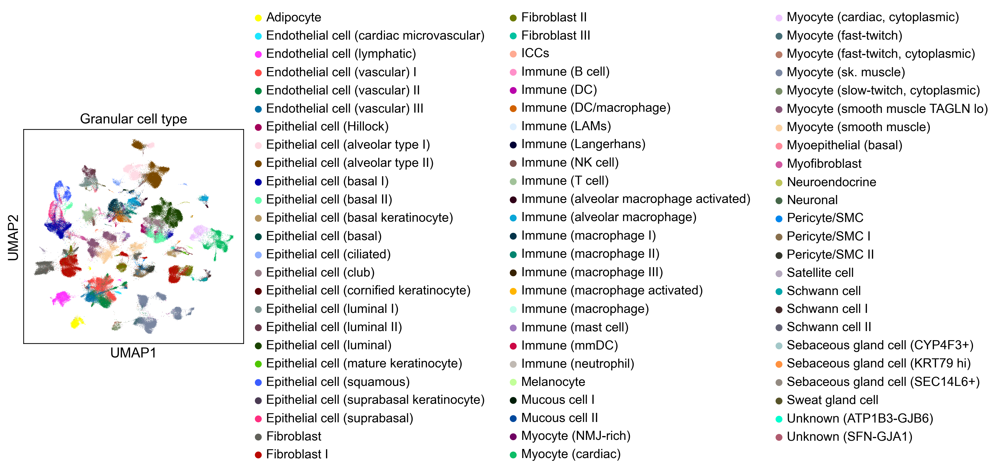

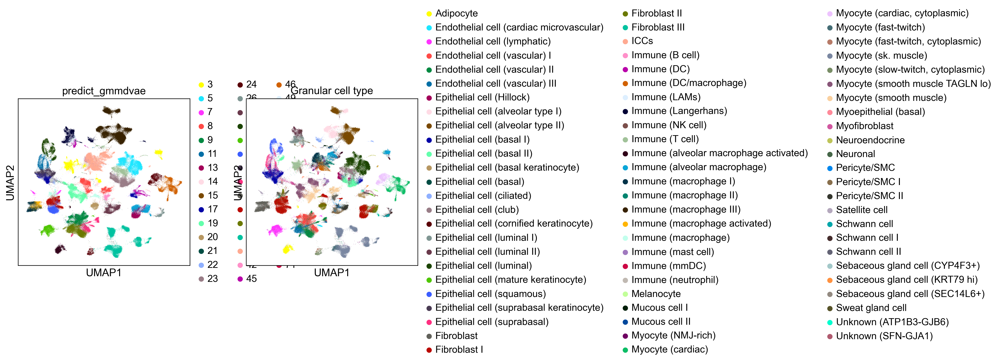

In [5]:
sc.pl.umap(adata, color=["predict_gmmdvae",], )
sc.pl.umap(adata, color=["Broad cell type",], )
sc.pl.umap(adata, color=["Granular cell type",], )

sc.pl.umap(adata, color=["predict_gmmdvae", "Granular cell type",], )


In [5]:
class VAE_Dirichlet_Type705a(nn.Module):
    """
    """

    def __init__(
        self,
        nx: int = 28 ** 2,
        nh: int = 3024,
        nz: int = 200,
        nw: int = 150,
        nclasses: int = 10,
        pa : float = 1e1,
        pb : float = 1e-2,
        pc : float = 1e-2,
    ) -> None:
        super().__init__()
        self.nx = nx
        self.nh = nh
        self.nz = nz
        self.nw = nw
        self.nclasses = nclasses
        self.pa = pa
        self.pa = pb
        self.pa = pc
        # Dirichlet constant prior:
        #self.l = 1e-3
        self.dir_prior = distributions.Dirichlet(1e-3*torch.ones(nclasses))
        self.logsigma_x = torch.nn.Parameter(torch.zeros(nx), requires_grad=True)
        self.kld_unreduced = lambda mu, logvar: -0.5 * (
            1 + logvar - mu.pow(2) - logvar.exp()
        )
        #self.y_prior = distributions.OneHotCategorical(probs=torch.ones(nclasses))
        self.y_prior = distributions.RelaxedOneHotCategorical(
                probs=torch.ones(nclasses), temperature=0.1,)
        self.w_prior = distributions.Normal(
            loc=torch.zeros(nw),
            scale=torch.ones(nw),
        )
        ## P network
        self.Px = ut.buildNetworkv2(
                [nz,nh,nh,nx],
                dropout=0.2, 
                activation=nn.LeakyReLU(),
                batchnorm=True,
                )
        self.Pz = ut.buildNetworkv2(
                [nw, nh, nh, 2*nclasses*nz],
                dropout=0.2, 
                activation=nn.LeakyReLU(),
                batchnorm=True,
                )
        self.Pz.add_module(
                "unflatten", 
                nn.Unflatten(1, (nclasses, 2*nz)))
        ## Q network
        self.Qwz = ut.buildNetworkv2(
                [nx,nh,nh,2*nw + 2*nz],
                dropout=0.2, 
                activation=nn.LeakyReLU(),
                batchnorm=True,
                )
        self.Qwz.add_module(
                "unflatten", 
                nn.Unflatten(1, (2, nz + nw)))
        self.Qy = ut.buildNetworkv2(
                [nw + nz, nh, nh, nclasses],
                dropout=0.2, 
                activation=nn.LeakyReLU(),
                batchnorm=True,
                )
        #self.Qy.add_module( "softmax", nn.Softmax(dim=-1))
        self.Qp = ut.buildNetworkv2(
                [nw + nz, nh, nh, nclasses],
                dropout=0.2, 
                activation=nn.LeakyReLU(),
                batchnorm=True,
                )
        #self.Qp.add_module( "softmax", nn.Softmax(dim=-1))

        return

    def printDict(self, d: dict):
        for k, v in d.items():
            print(k + ":", v.item())
        return

    def forward(self, input, y=None,):
        x = nn.Flatten()(input)
        losses = {}
        output = {}
        eps=1e-5
        wz = self.Qwz(x)
        mu_w = wz[:,0,:self.nw]
        logvar_w = wz[:,1,:self.nw].tanh()
        std_w = (0.5 * logvar_w).exp()
        noise = torch.randn_like(mu_w).to(x.device)
        w = mu_w + noise * std_w
        Qw = distributions.Normal(loc=mu_w, scale=std_w)
        mu_z = wz[:,0,self.nw:]
        logvar_z = wz[:,1,self.nw:].tanh()
        std_z = (0.5 * logvar_z).exp()
        noise = torch.randn_like(mu_z).to(x.device)
        z = mu_z + noise * std_z
        Qz = distributions.Normal(loc=mu_z, scale=std_z)
        output["wz"] = wz
        output["mu_z"] = mu_z
        output["mu_w"] = mu_w
        output["logvar_z"] = logvar_z
        output["logvar_w"] = logvar_w
        #q_y = self.Qy(wz[:,0,:])
        q_y_logits = self.Qy(torch.cat([w,z], dim=1))
        q_y = nn.Softmax(dim=-1)(q_y_logits)
        eps = 1e-6
        q_y = (eps/self.nclasses +  (1 - eps) * q_y)
        d_logits = self.Qp(torch.cat([w,z], dim=1))
        output["d_logits"] = d_logits
        #D_y = distributions.Dirichlet(d_logits.exp().clamp(1e-2, 1e8))
        D_y = distributions.Dirichlet(d_logits.exp())
        Qy = distributions.RelaxedOneHotCategorical(
                temperature=0.1, probs=q_y)
        #y = Qy.rsample().to(x.device)
        output["q_y"] = q_y
        output["w"]=w
        output["z"]=z
        #output["y"] = y
        rec = self.Px(z)
        logsigma_x = ut.softclip(self.logsigma_x, -7, 7)
        sigma_x = logsigma_x.exp()
        Qx = distributions.Normal(loc=rec, scale=sigma_x)
        loss_rec = -Qx.log_prob(x).sum(-1).mean()
        #loss_rec = nn.MSELoss(reduction='none')(rec,x).sum(-1).mean()
        output["rec"]= rec
        losses["rec"] = loss_rec
        z_w = self.Pz(w)
        mu_z_w = z_w[:,:,:self.nz]
        #logvar_z_w = z_w[:,:,self.nz:]
        logvar_z_w = z_w[:,:,self.nz:].tanh()
        std_z_w = (0.5*logvar_z_w).exp()
        Pz = distributions.Normal(
                loc=mu_z_w,
                scale=std_z_w,
                )
        output["Pz"] = Pz
        output["Qz"] = Qz
        loss_z = ut.kld2normal(
                mu=mu_z.unsqueeze(1),
                logvar=logvar_z.unsqueeze(1),
                mu2=mu_z_w,
                logvar2=logvar_z_w,
                ).sum(-1)
        lp_y = self.y_prior.logits.to(x.device)
        p_y = D_y.rsample()
        p_y = (eps/self.nclasses +  (1 - eps) * p_y)
        loss_p = (p_y * (
            p_y.log() - q_y.log())).sum(-1).mean()
        losses["loss_p"] = loss_p
        if y == None:
            loss_z = (q_y*loss_z).sum(-1).mean()
            #lp_y = self.y_prior.logits.to(x.device)
            loss_l = (q_y.mean(0) * (
                    q_y.mean(0).log() - lp_y)).sum()
            loss_y_alt = (q_y * (
                    (eps+q_y).log() - (eps+p_y).log())).sum(-1).mean()
            #loss_y_alt = (q_y * (
            #        q_y.log() - p_y.log())).sum(-1).mean()
        else:
            #loss_z = (q_y*loss_z).sum(-1).mean()
            loss_z = (y*loss_z).sum(-1).mean()
            Qy = distributions.OneHotCategorical(probs=q_y)
            loss_y_alt = loss_l = -Qy.log_prob(y).mean()
        losses["loss_z"] = loss_z
        loss_w = self.kld_unreduced(
                mu=mu_w,
                logvar=logvar_w).sum(-1).mean()
        losses["loss_w"]=loss_w
        losses["loss_l"] = loss_l
        loss_l_alt = (q_y * (
                (eps+q_y).log() - lp_y)).sum(-1).mean()
        losses["loss_l_alt"] = loss_l_alt
        loss_y = -1e0 * q_y.max(-1)[0].mean()
        losses["loss_y"] = loss_y
        Pd = distributions.Dirichlet(torch.ones_like(q_y) * self.pb)
        loss_d = self.pa * distributions.kl_divergence(D_y, Pd).mean()
        #loss_d = (D_y.log_prob(q_y) - Pd.log_prob(q_y)).mean()
        losses["loss_d"]=loss_d
        # alt loss_y:
        #Qy = distributions.OneHotCategorical(probs=q_y)
        losses["loss_y_alt"] = loss_y_alt
        total_loss = (
                loss_rec
                + loss_z 
                + loss_w
                + loss_d
                #+ 1e1 * loss_y
                #+ 1e1 * loss_l
                #+ 1e0 * loss_l_alt
                #+ loss_p
                + loss_y_alt
                )
        losses["total_loss"] = total_loss
        losses["num_clusters"] = torch.sum(torch.threshold(q_y, 0.5, 0).sum(0) > 0)
        output["losses"] = losses
        return output


In [6]:
model = VAE_Dirichlet_Type705a(
    nx=adata.n_vars, nh=1024,
    nz=64, nw=15,
    nclasses=enc_ct.classes_.size,
    pa=1e1,
    pb=1e-1,
    pc=1e-1,
                              )
model.apply(init_weights)

M6.basicTrain(model, unlabeled_loader, test_loader, num_epochs=25,
        wt=0, lr=1e-3,)


training phase
rec: 19175.09765625
loss_p: 1.191662073135376
loss_z: 39.43974304199219
loss_w: 7.172550678253174
loss_l: 0.1870478242635727
loss_l_alt: 0.4922811985015869
loss_y: -0.10183606296777725
loss_d: 3893.99169921875
loss_y_alt: 1.7425487041473389
total_loss: 23117.443359375
num_clusters: 0

training phase
rec: 9537.46875
loss_p: 17.10028839111328
loss_z: 14.130184173583984
loss_w: 4.531869888305664
loss_l: 0.9419145584106445
loss_l_alt: 3.992281913757324
loss_y: -0.8754130005836487
loss_d: 21.08934211730957
loss_y_alt: 13.245603561401367
total_loss: 9590.46484375
num_clusters: 36

training phase
rec: 5154.36767578125
loss_p: 17.558494567871094
loss_z: 14.55996036529541
loss_w: 4.123310089111328
loss_l: 1.0024802684783936
loss_l_alt: 4.1741180419921875
loss_y: -0.9483835697174072
loss_d: 14.589254379272461
loss_y_alt: 13.42693042755127
total_loss: 5201.0673828125
num_clusters: 34

training phase
rec: 3093.93994140625
loss_p: 17.368362426757812
loss_z: 14.260505676269531
loss_w:

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:24)


/home/ykolb/miniconda3/envs/torch/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'predict_gmmdvae' as categorical


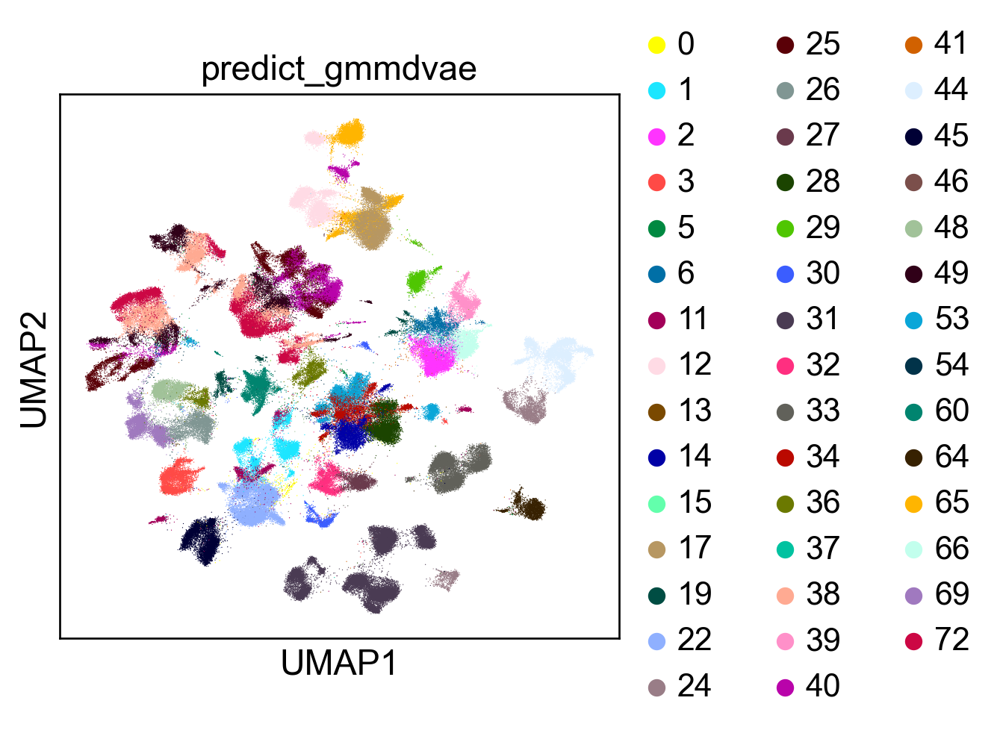

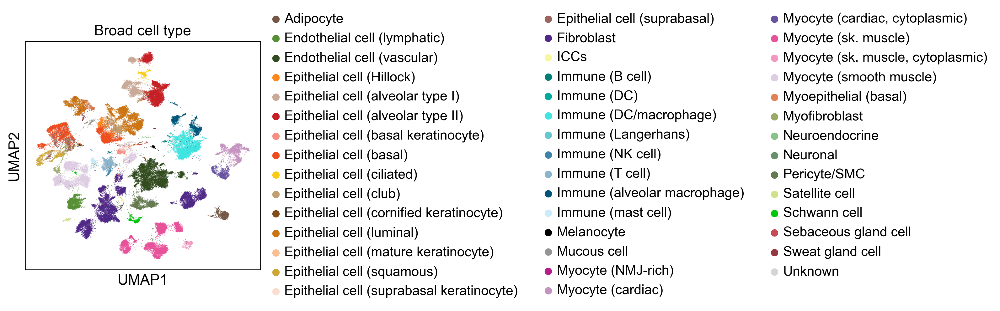

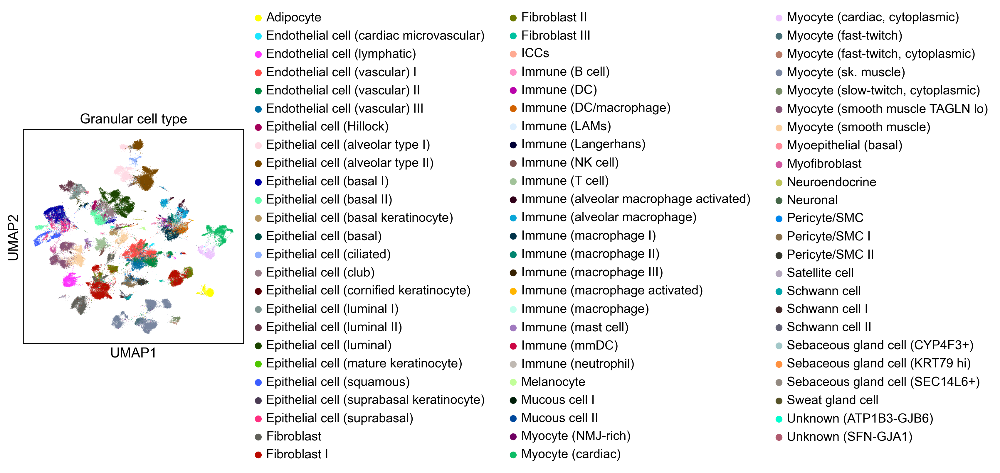

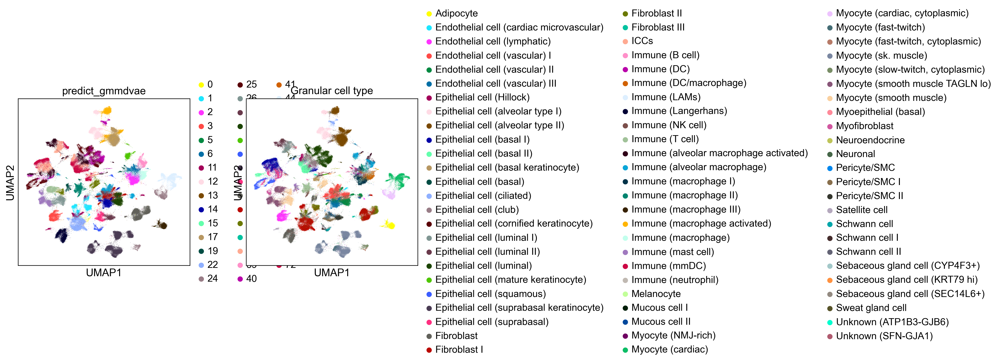

In [7]:
model.eval()
output = model(data)
adata.obsm["z_gmmdvae"] = output["z"].detach().numpy()
adata.obs["predict_gmmdvae"] = output["q_y"].detach().argmax(-1).numpy().astype(str)
sc.pp.neighbors(adata, use_rep="z_gmmdvae", n_neighbors=10,)
sc.tl.umap(adata,)

sc.pl.umap(adata, color=["predict_gmmdvae",], )
sc.pl.umap(adata, color=["Broad cell type",], )
sc.pl.umap(adata, color=["Granular cell type",], )
sc.pl.umap(adata, color=["predict_gmmdvae", "Granular cell type",], )

In [ ]:
del model
del adata
del data
